## Validation of the coadd procedure 

> Version: 1.0
> Container Size: Large

> Description: In this notebook, ...

In [1]:
# Complementary info
! echo $IMAGE_DESCRIPTION
! eups list -s | grep lsst_distrib

!python --version

Release r29.2.0 (RSP Build 2742)
lsst_distrib          gc675d380bf+f75de59d28 	v29_2_0 v29_2_0_rc1 current setup
Python 3.12.11


In [2]:
%load_ext autoreload
%autoreload

In [3]:
import numpy as np
import VeraRubin as vr
import matplotlib.pyplot as plt

from lsst.daf.butler import Butler

In [4]:
# Initialize remote Butler
COLLECTION = "LSSTComCam/DP1"
REPOSITORY = "dp1"

butler = Butler(config=REPOSITORY, collections=COLLECTION)
assert butler is not None

In [5]:
# General CONFIGURATION
REMOTE_REPO = vr.get_butler_location(butler)  # Remote butler repo path
COLLECTION = "LSSTComCam/DP1"

LOCAL_REPO = "local_butler"

### Info LOCAL REPO

In [6]:
local_repo_path = LOCAL_REPO #os.path.join(os.getenv("HOME"), LOCAL_REPO) 
info_txt_path = os.path.join(local_repo_path, "custom_coadd_info.txt")

with open(info_txt_path, "r") as f:
        info = json.load(f)
info

{'repo_path': './local_butler',
 'collection': 'custom_coadd/20260429T081552Z',
 'coadd_type': 'deep_coadd_predetection',
 'tract': 5063,
 'patch': '34',
 'bands': ['i', 'u'],
 'instrument': 'LSSTComCam',
 'skymap': 'lsst_cells_v1'}

In [7]:
local_repo_path = LOCAL_REPO #os.path.join(os.getenv("HOME"), LOCAL_REPO) 
info_txt_path = os.path.join(local_repo_path, "custom_coadd_info_without_stamp.txt")

with open(info_txt_path, "r") as f:
        info2 = json.load(f)
info2

{'repo_path': './local_butler',
 'collection': 'custom_coadd_without_stamp/20260429T084132Z',
 'coadd_type': 'deep_coadd_predetection',
 'tract': 5063,
 'patch': '34',
 'bands': ['i', 'u'],
 'instrument': 'LSSTComCam',
 'skymap': 'lsst_cells_v1'}

In [8]:
print("List of avalibles colections:")
# Collections
!butler query-collections --chains 'TREE' $LOCAL_REPO

List of avalibles colections:
                            Name                              Type 
----------------------------------------------------------- -------
LSSTComCam/runs/DRP/DP1/DM-51335                            RUN    
LSSTComCam/runs/DRP/DP1/DM-53601                            RUN    
LSSTComCam/runs/DRP/DP1/v29_0_0/DM-50260/20250416T185152Z   RUN    
custom_coadd                                                CHAINED
  custom_coadd/20260429T081552Z                             RUN    
  custom_coadd/inputs                                       TAGGED 
custom_coadd/20260429T081552Z                               RUN    
custom_coadd/inputs                                         TAGGED 
custom_coadd_without_stamp                                  CHAINED
  custom_coadd_without_stamp/20260429T084132Z               RUN    
  custom_coadd_without_stamp/inputs                         TAGGED 
custom_coadd_without_stamp/20260429T084132Z                 RUN    
custom_coadd_witho

### Loading

In [9]:
# Working with the local Butler
lbutler = Butler(LOCAL_REPO, collections='local_main_chain')  # original data
coadd_lbutler = Butler(LOCAL_REPO, collections='custom_coadd_without_stamp')  # coadd make without injection
inj_lbutler = Butler(LOCAL_REPO, collections='custom_coadd')  # with injection

In [10]:
# VISIT

In [11]:
band = 'u'
# extracting the visitsID of the used visit_image
visitID = inj_lbutler.query_datasets("visit_image",
                                     where=f"band = '{band}'")

In [12]:
visitNumber = 0
visit_data = lbutler.get('visit_image', dataId=visitID[visitNumber].dataId)
visit_data_withInject = inj_lbutler.get('visit_image', dataId=visitID[visitNumber].dataId)

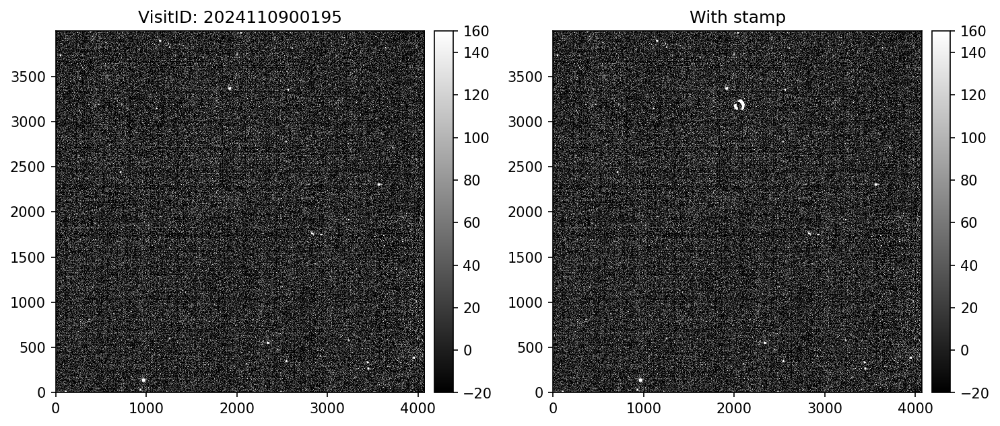

In [13]:
# Plot
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data.image)
ax[0].set_title(fr"VisitID: {visitID[visitNumber].dataId["visit"]:d}")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data_withInject.image)
ax[1].set_title(fr"With stamp")

plt.tight_layout()

In [14]:
# COADD

In [15]:
# Identify the coadd around location
ra_deg, dec_deg = (53.2, -27.8)
loc_data = ra_deg, dec_deg

tract, patch = vr.tract_patch(inj_lbutler, ra_deg, dec_deg, sequential_index=True)
data_coadd = {'band': band, 'skymap': 'lsst_cells_v1', 'tract': tract, 'patch': patch}

In [16]:
coadd_original = lbutler.get('deep_coadd', dataId=data_coadd)
coadd_visit = coadd_lbutler.get('deep_coadd_predetection', dataId=data_coadd)
coadd_visit_withInject = inj_lbutler.get('deep_coadd_predetection', dataId=data_coadd)

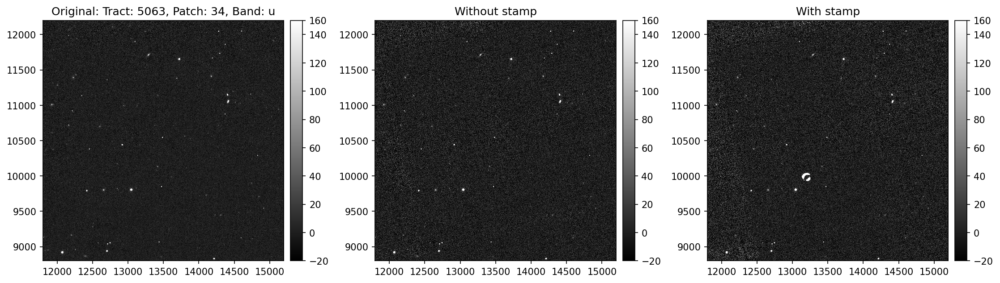

In [17]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")


fig, ax = plt.subplots(1, 3, figsize=(15, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_original.image)
ax[0].set_title(fr"Original: Tract: {tract}, Patch: {patch}, Band: {band}")


plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit.image)
ax[1].set_title(fr"Without stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[2].set_title(fr"With stamp")

plt.tight_layout()

## Comparing

### Custom Coadd vs Visit

In [18]:
# Directly subtraction
## Testing the coadd with the rotate/inject visits
ref_img = coadd_visit_withInject
img_to_warp = visit_data_withInject

rot_visit = vr.warp_img(ref_img, img_to_warp, warping_kernel="lanczos5")

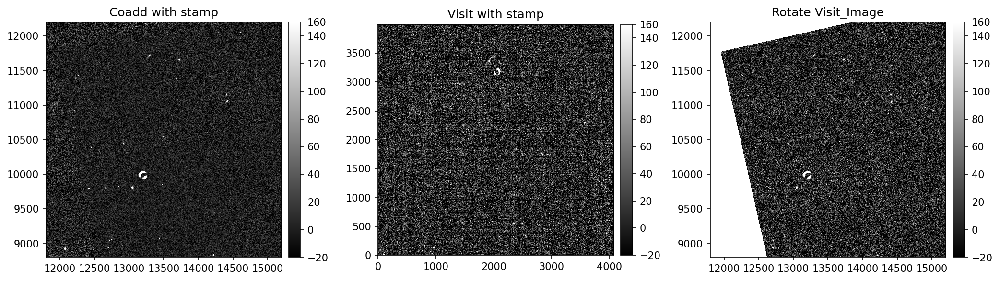

In [19]:
# Plot the result
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 3, figsize=(14, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data_withInject.image)
ax[1].set_title(fr"Visit with stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(rot_visit.image)
ax[2].set_title(fr"Rotate Visit_Image")

plt.tight_layout()

[INFO] Converted LSST SkyWcs -> Astropy WCS


/home/arestrada88/Alma_proyect/VeraRubin/plot/exposure_plot.py:223: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


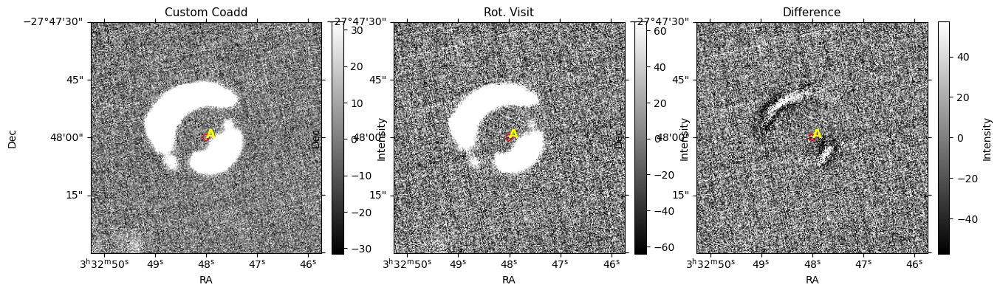

In [20]:
# Simple comparison (subtraction of both)
points = [loc_data]
before = coadd_visit_withInject
after = rot_visit

# necessary because the corner no is (0, 0)
bbox = after.getBBox()
xmin = bbox.getMinX()
xmax = bbox.getMaxX()
ymin = bbox.getMinY()
ymax = bbox.getMaxY()

vr.injection_steps(before,
                   after,
                   points,
                   diference=True,
                   cutout_radius_arcsec=30,  # arcsec  10
                   names=['Custom Coadd', 'Rot. Visit', 'Difference'],
                   grid=False, percentiles=[5, 95],
                   extent=[xmin, xmax, ymin, ymax])

In [21]:
# Using Alard Lupton SubtractTask

In [22]:
diff_visit_Coadd = vr.diff_AlardLupton(
    templateExposure=coadd_visit_withInject,
    scienceExposure=visit_data_withInject,
    warp=True)

===> Cleaning masks
===> Run detection


===> Run Deblend and Measurement


===> Selecting sky sources
194
Sky sources seleccionadas: 117
===> Warping
===> Subtracting


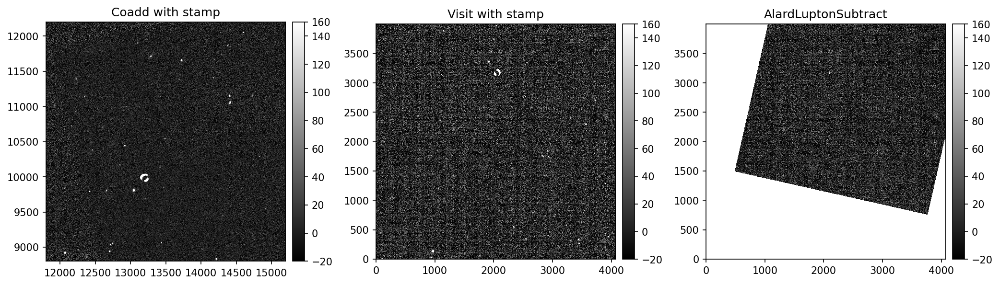

In [26]:
# Plot the result
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 3, figsize=(14, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data_withInject.image)
ax[1].set_title(fr"Visit with stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(diff_visit_Coadd.image)
ax[2].set_title(fr"AlardLuptonSubtract")

plt.tight_layout()

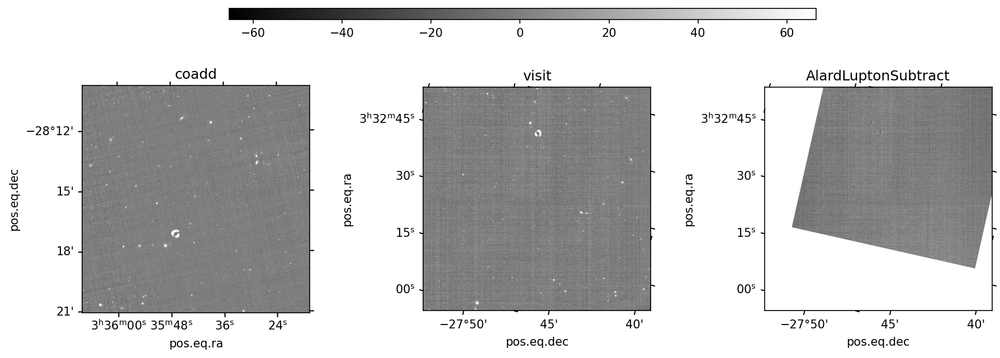

In [68]:
image0 = coadd_visit_withInject.getMaskedImage().getImage().getArray()
image1 = visit_data_withInject.getMaskedImage().getImage().getArray()
image2 = diff_visit_Coadd.getMaskedImage().getImage().getArray()

wcs0 = vr.skywcs_to_astropy(coadd_visit_withInject.getWcs())
wcs1 = vr.skywcs_to_astropy(diff_visit_Coadd.getWcs())
wcs2 = vr.skywcs_to_astropy(visit_data_withInject.getWcs())

vmin = np.nanpercentile([image1, image2], 5)
vmax = np.nanpercentile([image1, image2], 95)

fig = plt.figure(figsize=(14, 4.6), dpi=150)

ax0 = fig.add_subplot(1, 3, 1, projection=wcs0)
ax1 = fig.add_subplot(1, 3, 2, projection=wcs1)
ax2 = fig.add_subplot(1, 3, 3, projection=wcs2)

im0 = ax0.imshow(image0, origin='lower', cmap='gray', vmin=vmin, vmax=vmax)
im1 = ax1.imshow(image1, origin='lower', cmap='gray', vmin=vmin, vmax=vmax)
im2 = ax2.imshow(image2, origin='lower', cmap='gray', vmin=vmin, vmax=vmax)

ax0.set_title("coadd")
ax1.set_title("visit")
ax2.set_title("AlardLuptonSubtract")

cax = fig.add_axes([0.25, 0.96, 0.5, 0.03])  # [left, bottom, width, height]
cbar = fig.colorbar(im0, cax=cax, orientation='horizontal')
#cbar.set_label("Flux")

plt.subplots_adjust(wspace=0.5)

[INFO] Converted LSST SkyWcs -> Astropy WCS


/home/arestrada88/Alma_proyect/VeraRubin/plot/exposure_plot.py:223: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


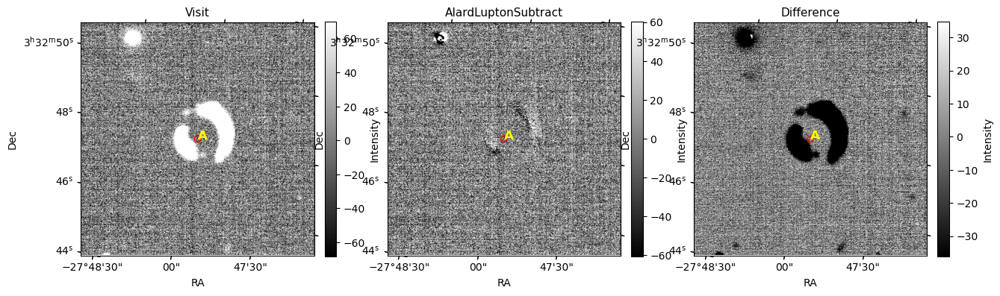

In [47]:
# Simple comparison (subtraction of both)
points = [loc_data]
before = visit_data_withInject
after = diff_visit_Coadd

# necessary because the corner no is (0, 0)
bbox = after.getBBox()
xmin = bbox.getMinX()
xmax = bbox.getMaxX()
ymin = bbox.getMinY()
ymax = bbox.getMaxY()

vr.injection_steps(before,
                   after,
                   points,
                   diference=True,
                   cutout_radius_arcsec=10,  # arcsec  10
                   names=['Visit', 'AlardLuptonSubtract', 'Difference'],
                   grid=False, percentiles=[5, 95],
                   extent=[xmin, xmax, ymin, ymax])

### Custom Coadd vs Custom Coadd without injection

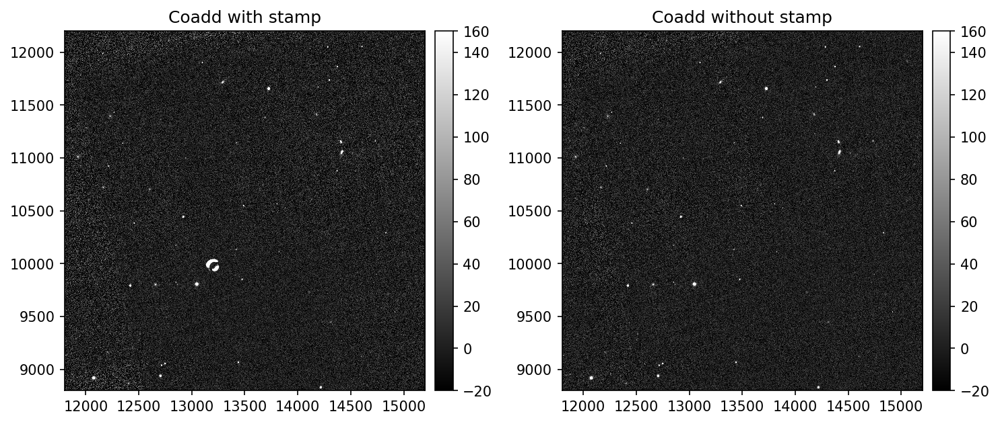

In [28]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
# display0.scale('linear', 'zscale')
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")


plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
# display0.scale('linear', 'zscale')
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit.image)
ax[1].set_title(fr"Coadd without stamp")

plt.tight_layout()

[INFO] Converted LSST SkyWcs -> Astropy WCS


/home/arestrada88/Alma_proyect/VeraRubin/plot/exposure_plot.py:223: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


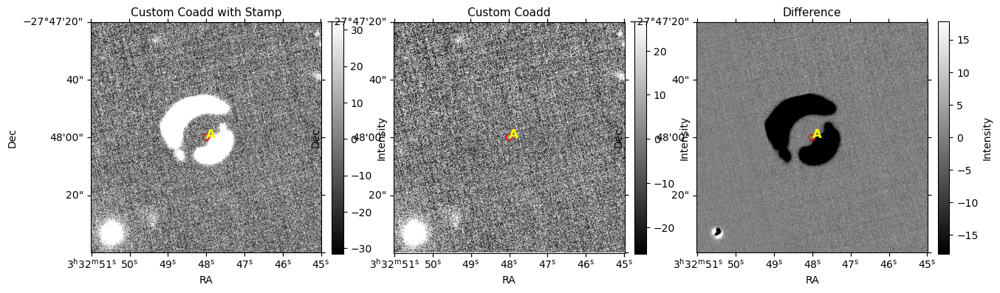

In [29]:
# Simple comparison (subtraction of both)
points = [loc_data]
before = coadd_visit_withInject
after = coadd_visit

# necessary because the corner no is (0, 0)
bbox = after.getBBox()
xmin = bbox.getMinX()
xmax = bbox.getMaxX()
ymin = bbox.getMinY()
ymax = bbox.getMaxY()

vr.injection_steps(before,
                   after,
                   points,
                   diference=True,
                   cutout_radius_arcsec=40,  # arcsec  10
                   names=['Custom Coadd with Stamp', 'Custom Coadd', 'Difference'],
                   grid=False, percentiles=[5, 95],
                   extent=[xmin, xmax, ymin, ymax])

In [31]:
diff_coadd_Coadd = vr.diff_AlardLupton(
    templateExposure=coadd_visit_withInject,
    scienceExposure=coadd_visit,
    warp=False)

===> Cleaning masks
===> Run detection


===> Run Deblend and Measurement


===> Sky sources
===> Subtracting


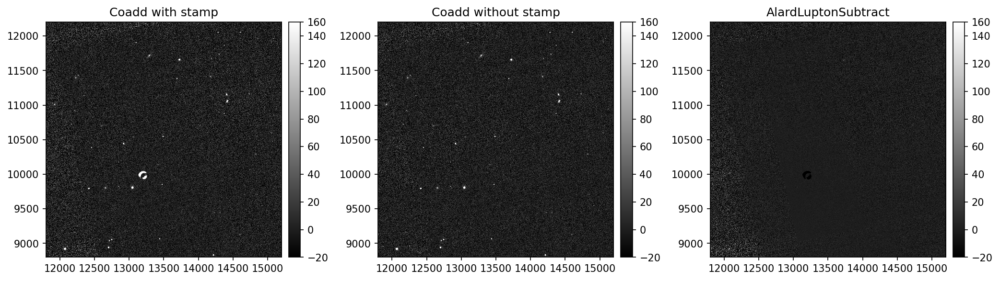

In [32]:
# Plot the result
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 3, figsize=(14, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit.image)
ax[1].set_title(fr"Coadd without stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(diff_coadd_Coadd.image)
ax[2].set_title(fr"AlardLuptonSubtract")

plt.tight_layout()

#### Custom Coadd vs Coadd